In [ ]:
import os
import numpy as np
from PIL import Image
import torch
from tqdm import tqdm
import matplotlib.pyplot as plt
from transformers import CLIPProcessor, CLIPModel
from sklearn.metrics.pairwise import cosine_similarity

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")


config.json: 0.00B [00:00, ?B/s]

C:\Users\Hussnain35\anaconda3\envs\myenv\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\Hussnain35\.cache\huggingface\hub\models--openai--clip-vit-base-patch32. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back 

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


vocab.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [ ]:
def build_image_embeddings(image_folder, save_folder="embeddings"):
    os.makedirs(save_folder, exist_ok=True)

    image_paths = []
    embeddings = []

    print("\nBuilding image embeddings...")

    for img_name in tqdm(os.listdir(image_folder)):
        try:
            img_path = os.path.join(image_folder, img_name)
            image = Image.open(img_path).convert("RGB")

            inputs = processor(images=image, return_tensors="pt").to(device)
            emb = model.get_image_features(**inputs)
            emb = emb / emb.norm(p=2)  # normalize

            embeddings.append(emb.cpu().detach().numpy())
            image_paths.append(img_path)
        except:
            continue

    embeddings = np.vstack(embeddings)

    np.save(os.path.join(save_folder, "image_embeddings.npy"), embeddings)
    np.save(os.path.join(save_folder, "image_paths.npy"), np.array(image_paths))

    print("Saved embeddings successfully!")


In [ ]:
def show_images(image_paths, scores, query):
    plt.figure(figsize=(15, 6))
    plt.suptitle(f"Top Results for: \"{query}\"", fontsize=16)

    for i, (path, score) in enumerate(zip(image_paths, scores)):
        img = Image.open(path).convert("RGB")

        plt.subplot(1, len(image_paths), i + 1)
        plt.imshow(img)
        plt.title(f"{score:.3f}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


In [ ]:
def search(query, emb_path="embeddings/image_embeddings.npy",
           path_path="embeddings/image_paths.npy", top_k=5):

    embeddings = np.load(emb_path)
    image_paths = np.load(path_path)

    # Encode text
    text_inputs = processor(text=[query], return_tensors="pt").to(device)
    text_emb = model.get_text_features(**text_inputs)
    text_emb = text_emb / text_emb.norm(p=2)
    text_emb = text_emb.cpu().detach().numpy()

    # Compute similarity
    sims = cosine_similarity(text_emb, embeddings)[0]

    # Top K
    idx = np.argsort(sims)[::-1][:top_k]
    top_paths = image_paths[idx]
    top_scores = sims[idx]

    # Print filenames
    print(f"\nTop {top_k} results:")
    for p, s in zip(top_paths, top_scores):
        print(f"{p} - {s:.4f}")

  
    show_images(top_paths, top_scores, query)



=== CLIP Meme Search ===


Build embeddings again? (y/n):  y



Building image embeddings...



%|          | 0/6992 [00:00<?, ?it/s]
%|          | 1/6992 [00:00<18:12,  6.40it/s]
%|          | 4/6992 [00:00<07:11, 16.21it/s]
%|          | 7/6992 [00:00<05:25, 21.43it/s]
%|          | 10/6992 [00:00<05:00, 23.23it/s]
%|          | 14/6992 [00:00<04:16, 27.17it/s]
%|          | 18/6992 [00:00<03:55, 29.61it/s]
%|          | 22/6992 [00:00<03:43, 31.12it/s]
%|          | 26/6992 [00:00<03:46, 30.81it/s]
%|          | 30/6992 [00:01<03:39, 31.70it/s]
%|          | 34/6992 [00:01<03:42, 31.31it/s]
%|          | 38/6992 [00:01<03:45, 30.81it/s]
%|          | 42/6992 [00:01<03:56, 29.41it/s]
%|          | 45/6992 [00:01<03:55, 29.50it/s]
%|          | 49/6992 [00:01<03:53, 29.79it/s]
%|          | 52/6992 [00:01<04:12, 27.47it/s]
%|          | 55/6992 [00:02<04:31, 25.55it/s]
%|          | 59/6992 [00:02<04:10, 27.70it/s]
%|          | 62/6992 [00:02<04:13, 27.30it/s]
%|          | 66/6992 [00:02<03:56, 29.33it/s]
%|          | 69/6992 [00:02<03:56, 29.33it/s]
%|          | 73/6992 [0

Saved embeddings successfully!



Enter search query (or 'exit'):  avengers



Top 5 results:
data/memes\image_68.jpg - 0.3297
data/memes\image_6939.jpg - 0.3234
data/memes\image_5111.jpg - 0.3210
data/memes\image_4305.jpg - 0.3205
data/memes\image_6932.jpg - 0.3197


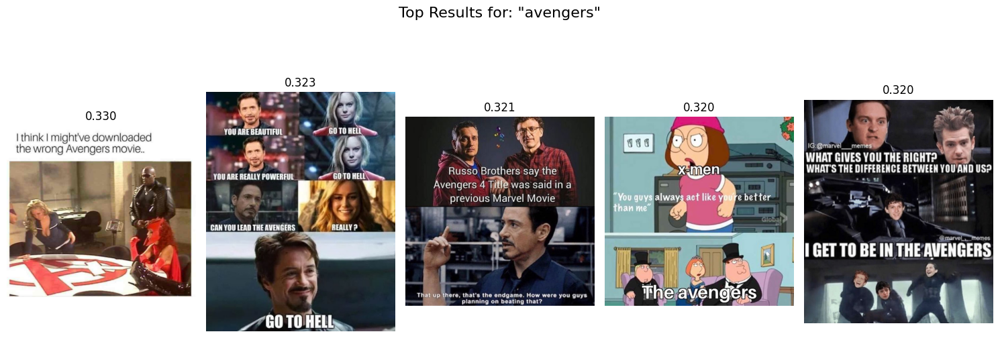


Enter search query (or 'exit'):  class



Top 5 results:
data/memes\image_121.jpg - 0.2864
data/memes\image_2410.png - 0.2751
data/memes\image_1203.jpg - 0.2707
data/memes\image_3717.jpg - 0.2699
data/memes\image_5276.jpg - 0.2686


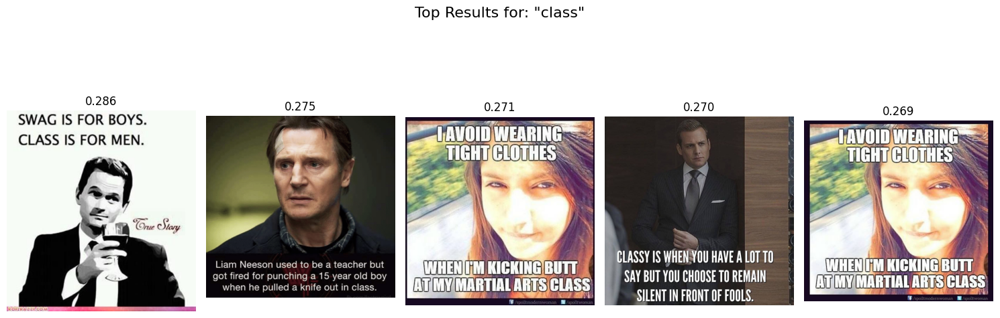


Enter search query (or 'exit'):  shool



Top 5 results:
data/memes\image_4627.jpg - 0.2846
data/memes\image_598.jpg - 0.2776
data/memes\image_4634.jpg - 0.2711
data/memes\image_275.jpg - 0.2687
data/memes\image_3548.jpg - 0.2630


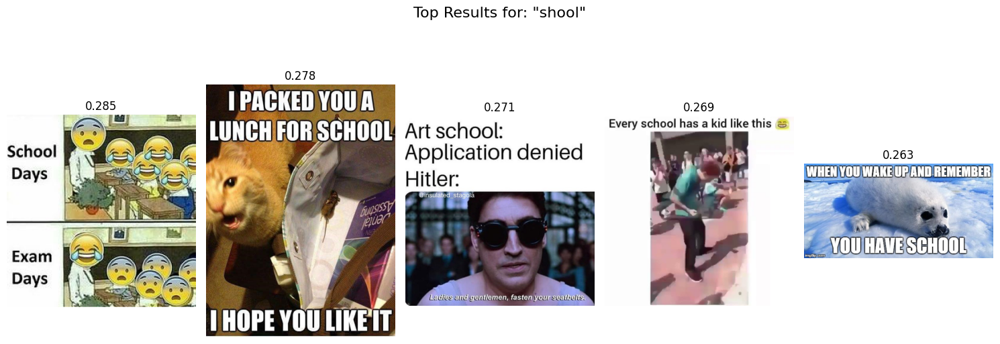


Enter search query (or 'exit'):  cat confused



Top 5 results:
data/memes\image_683.jpeg - 0.3127
data/memes\image_4444.jpg - 0.3070
data/memes\image_541.jpg - 0.3040
data/memes\image_5404.jpg - 0.3009
data/memes\image_531.jpg - 0.3004


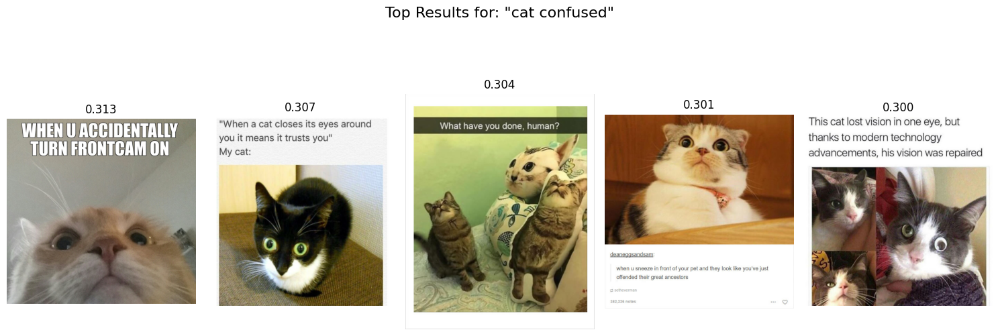


Enter search query (or 'exit'):  cat happy



Top 5 results:
data/memes\image_528.jpg - 0.2863
data/memes\image_649.png - 0.2834
data/memes\image_541.jpg - 0.2824
data/memes\image_4188.jpg - 0.2813
data/memes\image_563.jpg - 0.2781


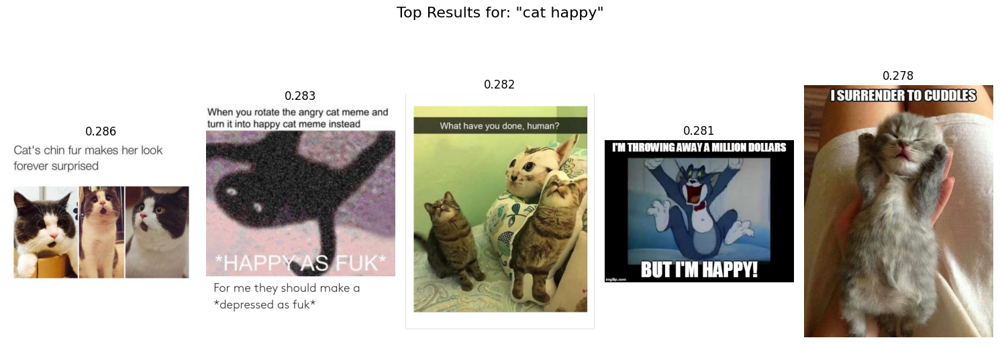


Enter search query (or 'exit'):  cuddles



Top 5 results:
data/memes\image_563.jpg - 0.2832
data/memes\image_600.jpg - 0.2813
data/memes\image_5190.jpg - 0.2761
data/memes\image_650.jpg - 0.2739
data/memes\image_630.jpg - 0.2668


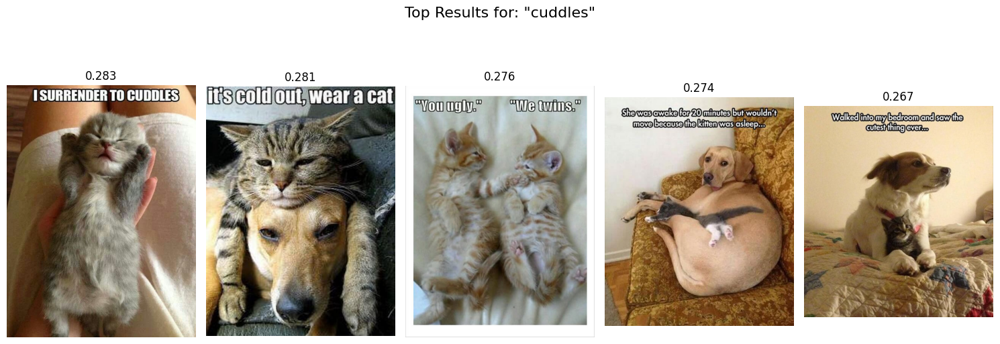


Enter search query (or 'exit'):  cats



Top 5 results:
data/memes\image_310.jpg - 0.2994
data/memes\image_541.jpg - 0.2966
data/memes\image_633.jpg - 0.2955
data/memes\image_6182.jpg - 0.2952
data/memes\image_5271.png - 0.2944


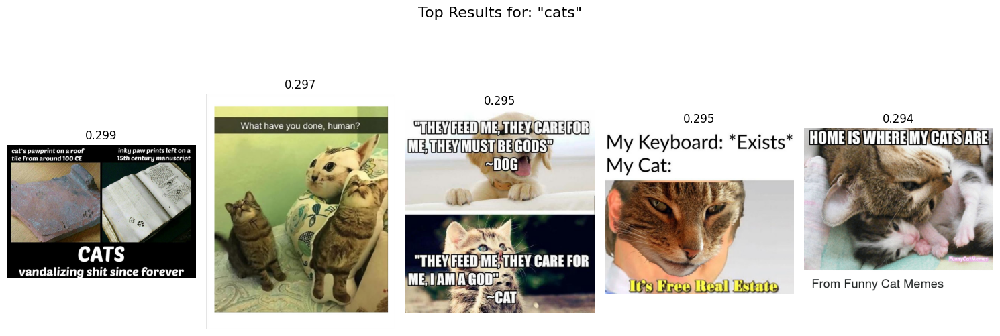


Enter search query (or 'exit'):  school



Top 5 results:
data/memes\image_1836.jpg - 0.2800
data/memes\image_598.jpg - 0.2740
data/memes\image_3155.jpg - 0.2726
data/memes\image_4627.jpg - 0.2725
data/memes\image_4634.jpg - 0.2711


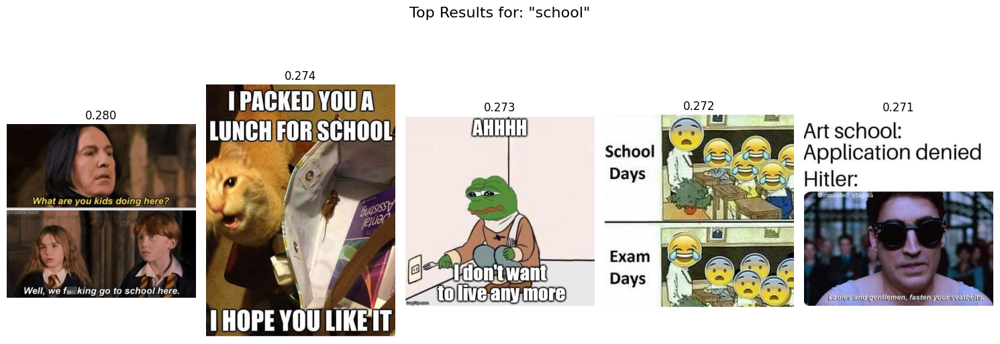


Enter search query (or 'exit'):  frogs



Top 5 results:
data/memes\image_1213.jpg - 0.3222
data/memes\image_3162.jpg - 0.3171
data/memes\image_4950.png - 0.3033
data/memes\image_6716.png - 0.3008
data/memes\image_3175.jpg - 0.2927


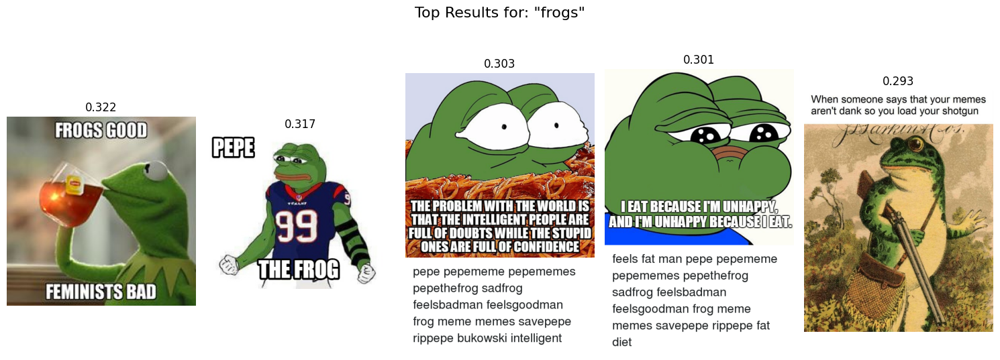


Enter search query (or 'exit'):  men



Top 5 results:
data/memes\image_5582.jpg - 0.3191
data/memes\image_2696.jpg - 0.3179
data/memes\image_5139.jpg - 0.3079
data/memes\image_3631.jpg - 0.3058
data/memes\image_1167.jpeg - 0.3049


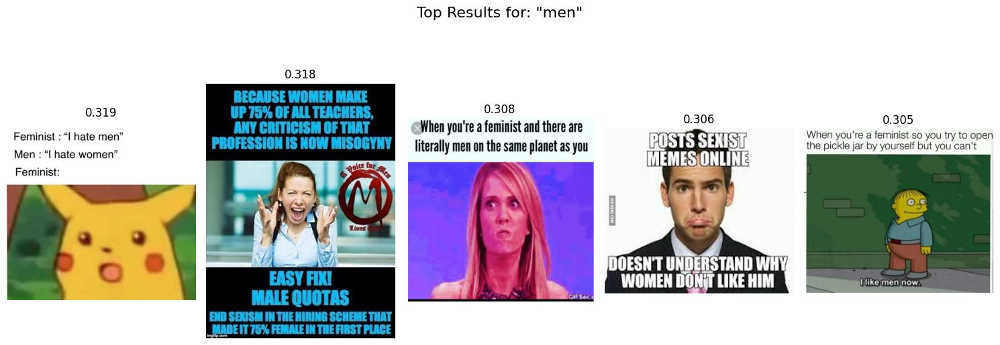


Enter search query (or 'exit'):  simsons good



Top 5 results:
data/memes\image_506.png - 0.2773
data/memes\image_4004.png - 0.2746
data/memes\image_5311.jpg - 0.2725
data/memes\image_131.jpg - 0.2687
data/memes\image_4417.png - 0.2684


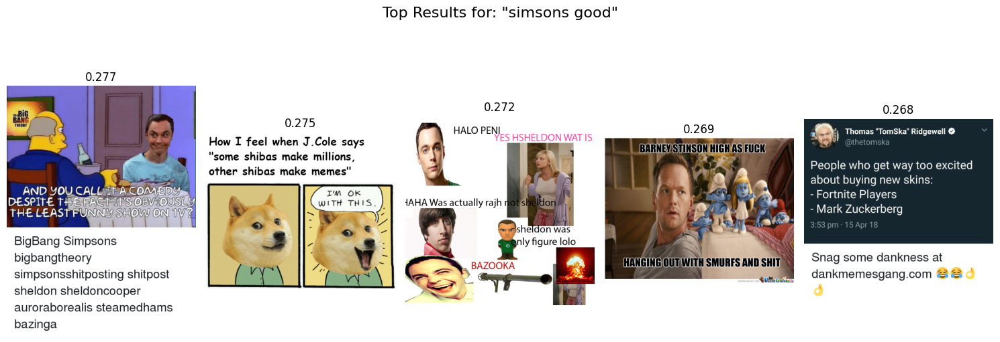


Enter search query (or 'exit'):  hmm



Top 5 results:
data/memes\image_4787.jpeg - 0.2769
data/memes\image_4724.png - 0.2708
data/memes\image_4701.jpg - 0.2700
data/memes\image_4494.jpg - 0.2696
data/memes\image_2313.jpg - 0.2695


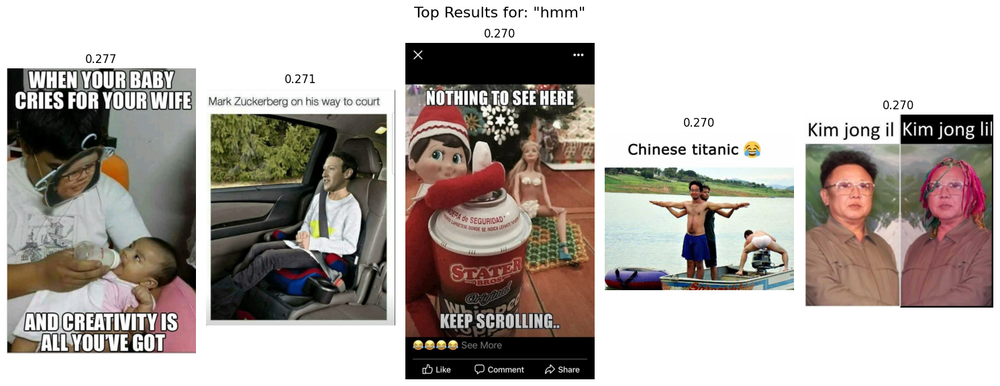


Enter search query (or 'exit'):  pakistan



Top 5 results:
data/memes\image_5191.jpg - 0.2872
data/memes\image_5273.jpg - 0.2820
data/memes\image_2790.jpg - 0.2746
data/memes\image_200.jpg - 0.2706
data/memes\image_6478.jpg - 0.2694


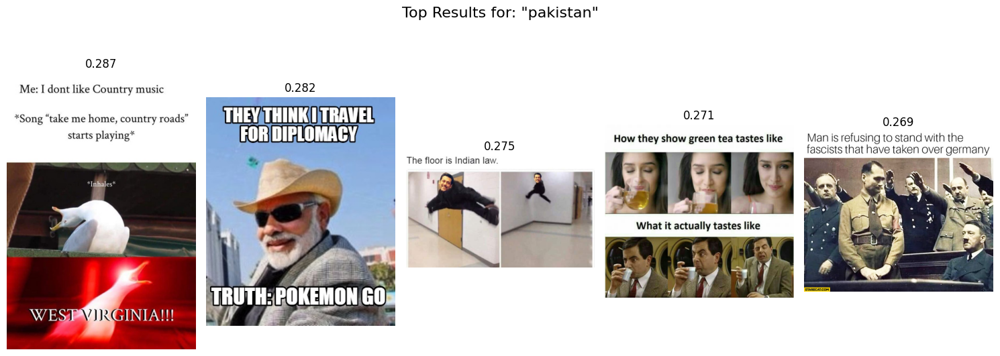


Enter search query (or 'exit'):  germany



Top 5 results:
data/memes\image_1202.png - 0.2940
data/memes\image_2043.jpeg - 0.2804
data/memes\image_2083.jpg - 0.2764
data/memes\image_5191.jpg - 0.2743
data/memes\image_5565.png - 0.2726


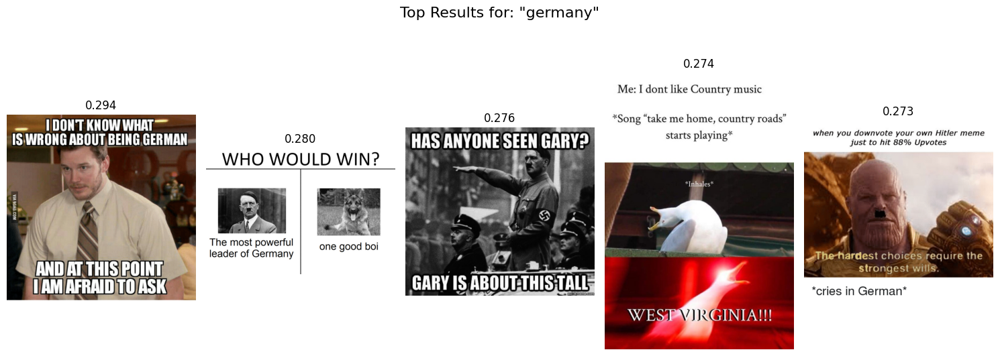

In [ ]:
if __name__ == "__main__":
    IMAGE_FOLDER = "data/memes"

    print("\n=== CLIP Meme Search ===")

    build = input("Build embeddings again? (y/n): ")

    if build.lower() == "y":
        build_image_embeddings(IMAGE_FOLDER)

    while True:
        q = input("\nEnter search query (or 'exit'): ")
        if q.lower() == "exit":
            break
        search(q)
